Data Set Information:

Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes. 
The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.


Attribute Information:

Date : year-month-day 
Rented Bike count - Count of bikes rented at each hour 
Hour - Hour of he day 
Temperature-Temperature in Celsius 
Humidity - % 
Windspeed - m/s 
Visibility - 10m 
Dew point temperature - Celsius 
Solar radiation - MJ/m2 
Rainfall - mm 
Snowfall - cm 
Seasons - Winter, Spring, Summer, Autumn 
Holiday - Holiday/No holiday 
Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

### 1. Import and warehouse data:

In [1]:
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
#from sklearn.feature_extraction.text import CountVectorizer  #DT does not take strings as input for the model fit step....
from IPython.display import Image  
#import pydotplus as pydot
from sklearn import tree
from os import system
import os
import glob
import time
sns.set_theme()

In [2]:
bikedata= pd.read_csv("SeoulBikeData.csv",encoding = 'unicode_escape')
bikedata.head(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/17,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/17,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/17,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/17,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/17,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [3]:
bikedataorig=pd.read_csv("SeoulBikeData.csv",encoding = 'unicode_escape')

In [4]:
bikedataorig.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/17,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/17,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/17,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/17,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/17,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [5]:
bikedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [6]:
print(bikedata.shape)
print(bikedata.size)

(8760, 14)
122640


In [7]:
bikedata.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [8]:
bikedata.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

### 2. Data Cleansing

In [9]:
bikedata['Seasons'].unique()

array(['Winter', 'Spring', 'Summer', 'Autumn'], dtype=object)

In [10]:
bikedata['Holiday'].unique()

array(['No Holiday', 'Holiday'], dtype=object)

In [11]:
bikedata['Functioning Day'].unique()

array(['Yes', 'No'], dtype=object)

In [12]:
bikedata.rename(columns = {'Functioning Day':'FunctioningDay'}, inplace = True)

In [13]:
bikedata.rename(columns = {'Snowfall (cm)':'Snowfall'}, inplace = True)

In [14]:
bikedata.rename(columns = {'Rainfall(mm)':'Rainfall'}, inplace = True)

In [15]:
bikedata['Date']=pd.to_datetime(bikedata['Date'])
bikedata['Year']=bikedata['Date'].dt.year
bikedata['Month']=bikedata['Date'].dt.month
bikedata['Day']=bikedata['Date'].dt.day
bikedata['WeekDay']=bikedata['Date'].dt.day_name()
mapping_dictDay={'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7}
bikedata['WeekDayEncoding']=bikedata['WeekDay'].map(mapping_dictDay)

In [16]:
bikedata=bikedata.drop('Date',axis=1)

In [17]:
bikedata.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall,Snowfall,Seasons,Holiday,FunctioningDay,Year,Month,Day,WeekDay,WeekDayEncoding
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4


In [18]:
bikedataorig.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/17,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/17,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/17,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/17,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/17,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [19]:
for feature in bikedata.columns: # Loop through all columns in the dataframe
    if bikedata[feature].dtype == 'object': # Only apply for columns with categorical strings
        bikedata[feature] = pd.Categorical(bikedata[feature])# Replace strings with an integer
bikedata.head(10)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall,Snowfall,Seasons,Holiday,FunctioningDay,Year,Month,Day,WeekDay,WeekDayEncoding
0,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
1,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
2,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
3,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
4,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
5,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
6,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
7,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
8,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4
9,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes,2017,1,12,Thursday,4


In [20]:
bikedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Rented Bike Count          8760 non-null   int64   
 1   Hour                       8760 non-null   int64   
 2   Temperature(°C)            8760 non-null   float64 
 3   Humidity(%)                8760 non-null   int64   
 4   Wind speed (m/s)           8760 non-null   float64 
 5   Visibility (10m)           8760 non-null   int64   
 6   Dew point temperature(°C)  8760 non-null   float64 
 7   Solar Radiation (MJ/m2)    8760 non-null   float64 
 8   Rainfall                   8760 non-null   float64 
 9   Snowfall                   8760 non-null   float64 
 10  Seasons                    8760 non-null   category
 11  Holiday                    8760 non-null   category
 12  FunctioningDay             8760 non-null   category
 13  Year                       8760 n

In [21]:
replaceStruct = {
                "Holiday":     {"No Holiday": 0, "Holiday": 1},
                "FunctioningDay": {"No": 0, "Yes": 1}
                    }
oneHotCols=["Seasons"]

In [22]:
bikedata=bikedata.replace(replaceStruct)
bikedata=pd.get_dummies(bikedata, columns=oneHotCols)
bikedata.head(10)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall,Snowfall,...,FunctioningDay,Year,Month,Day,WeekDay,WeekDayEncoding,Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter
0,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
5,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
6,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
7,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
8,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
9,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1


In [23]:
bikedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Rented Bike Count          8760 non-null   int64   
 1   Hour                       8760 non-null   int64   
 2   Temperature(°C)            8760 non-null   float64 
 3   Humidity(%)                8760 non-null   int64   
 4   Wind speed (m/s)           8760 non-null   float64 
 5   Visibility (10m)           8760 non-null   int64   
 6   Dew point temperature(°C)  8760 non-null   float64 
 7   Solar Radiation (MJ/m2)    8760 non-null   float64 
 8   Rainfall                   8760 non-null   float64 
 9   Snowfall                   8760 non-null   float64 
 10  Holiday                    8760 non-null   int64   
 11  FunctioningDay             8760 non-null   int64   
 12  Year                       8760 non-null   int64   
 13  Month                      8760 n

### 3. EDA

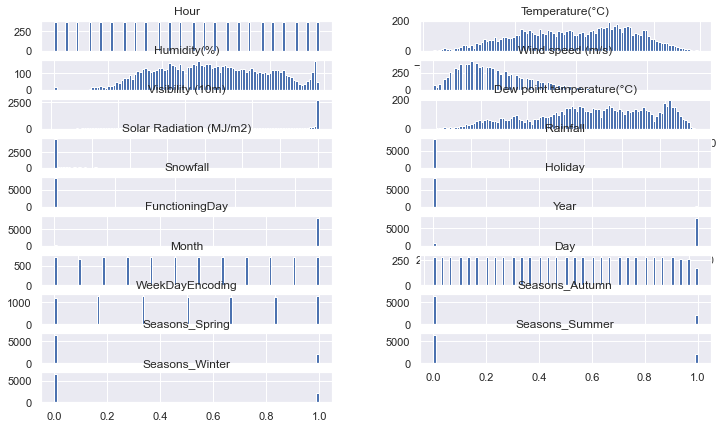

In [24]:
columns = list(bikedata)[1:] # Excluding Outcome column which has only 
bikedata[columns].hist(stacked=False, bins=100, figsize=(12,30), layout=(42,2)); 
# Distribution of all columns

In [25]:
bikedata.skew(axis = 0, skipna = True)

Rented Bike Count             1.153428
Hour                          0.000000
Temperature(°C)              -0.198326
Humidity(%)                   0.059579
Wind speed (m/s)              0.890955
Visibility (10m)             -0.701786
Dew point temperature(°C)    -0.367298
Solar Radiation (MJ/m2)       1.504040
Rainfall                     14.533232
Snowfall                      8.440801
Holiday                       4.163603
FunctioningDay               -5.170969
Year                         -2.978262
Month                        -0.010458
Day                           0.007522
WeekDayEncoding               0.000688
Seasons_Autumn                1.159123
Seasons_Spring                1.142294
Seasons_Summer                1.142294
Seasons_Winter                1.176139
dtype: float64

In [26]:
bikedataorig.corr()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804
Hour,0.410257,1.000000,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183
Wind speed (m/s),0.121108,0.285197,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887
Solar Radiation (MJ/m2),0.261837,0.145131,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301
Rainfall(mm),-0.123074,0.008715,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500
Snowfall (cm),-0.141804,-0.021516,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000


In [27]:
def plot_corr(bikedataorig, size=26):
    corr = bikedataorig.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)

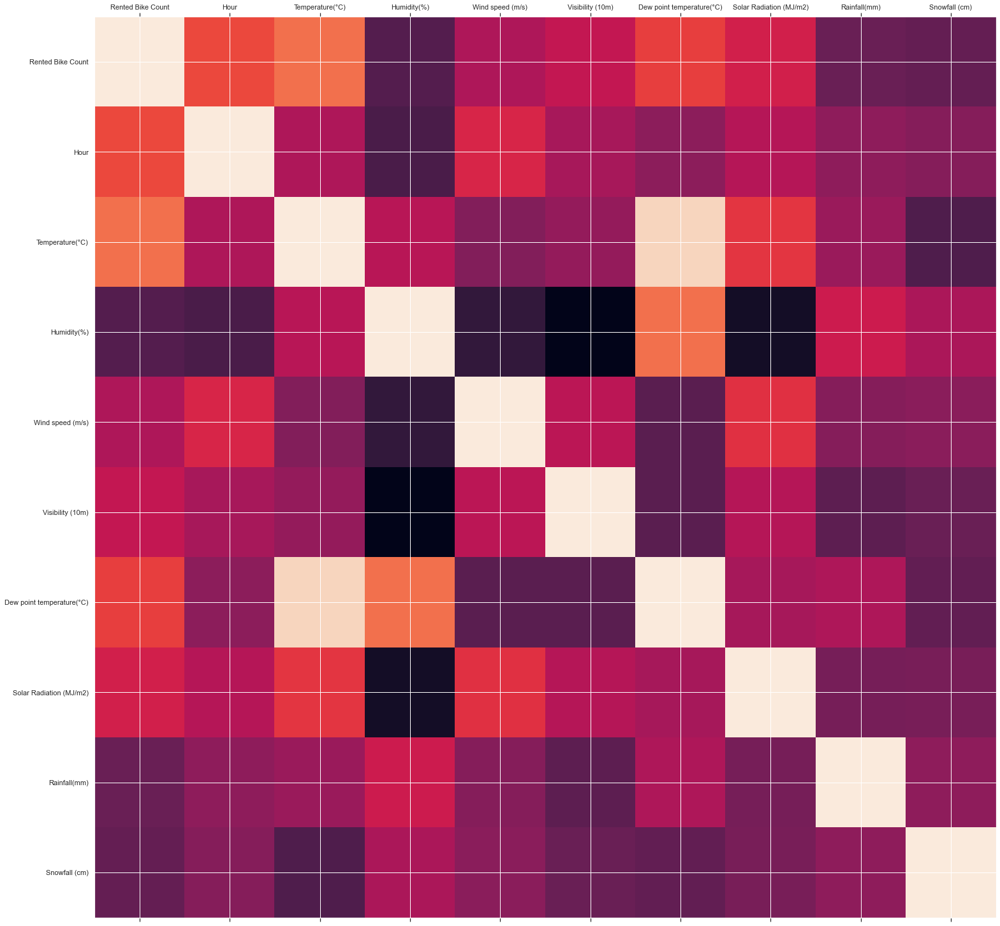

In [28]:
plot_corr(bikedataorig)

<AxesSubplot:xlabel='Hour', ylabel='Rented Bike Count'>

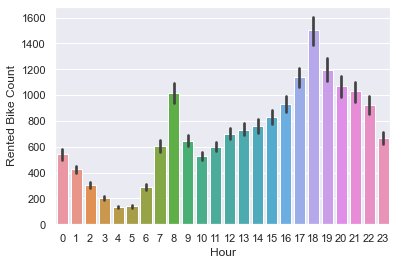

In [29]:
sns.barplot(data=bikedata, x="Hour", y="Rented Bike Count")

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Rented Bike Count'>

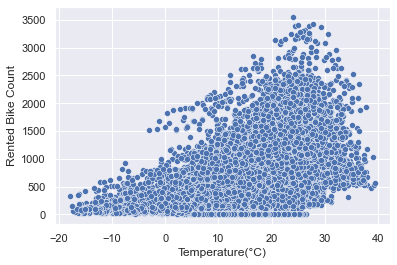

In [30]:
sns.scatterplot(data=bikedata, x="Temperature(°C)", y="Rented Bike Count")

<AxesSubplot:xlabel='Solar Radiation (MJ/m2)', ylabel='Rented Bike Count'>

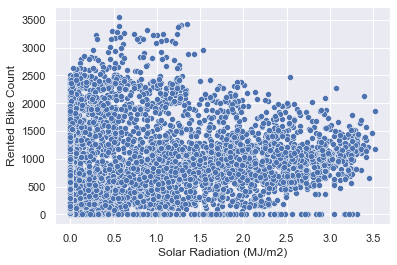

In [31]:
sns.scatterplot(data=bikedata, x="Solar Radiation (MJ/m2)", y="Rented Bike Count")

<AxesSubplot:xlabel='Visibility (10m)', ylabel='Rented Bike Count'>

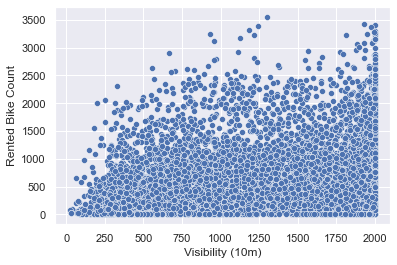

In [32]:
sns.scatterplot(data=bikedata, x="Visibility (10m)", y="Rented Bike Count")

In [33]:
bikedata.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall,Snowfall,...,FunctioningDay,Year,Month,Day,WeekDay,WeekDayEncoding,Seasons_Autumn,Seasons_Spring,Seasons_Summer,Seasons_Winter
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,...,1,2017,1,12,Thursday,4,0,0,0,1


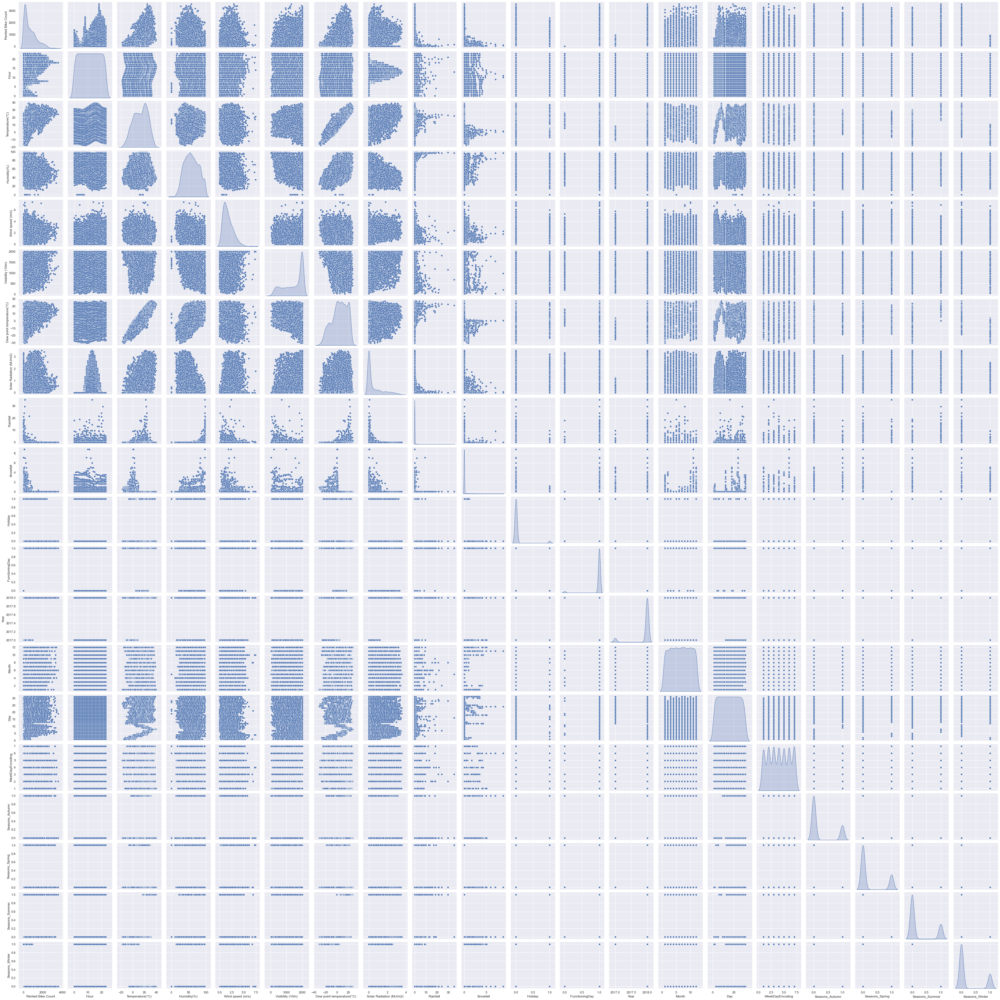

In [34]:
sns.pairplot(bikedata,diag_kind='kde')

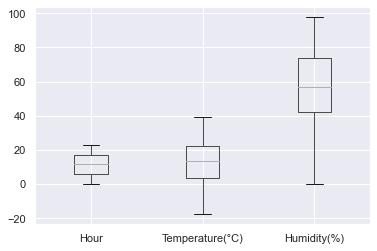

In [35]:
np.random.seed(1234)
boxplot = bikedata.boxplot(column=['Hour', 'Temperature(°C)', 'Humidity(%)'])

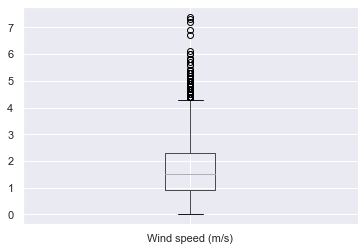

In [36]:
boxplot1=bikedata.boxplot(column=['Wind speed (m/s)'])

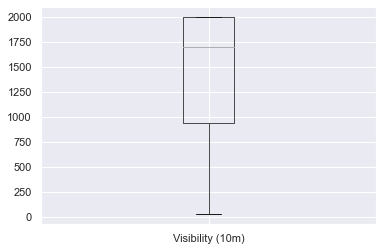

In [37]:
boxplot2=bikedata.boxplot(column=['Visibility (10m)'])

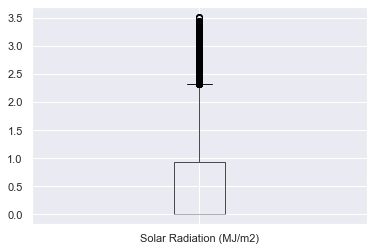

In [38]:
boxplot3=bikedata.boxplot(column=['Solar Radiation (MJ/m2)'])

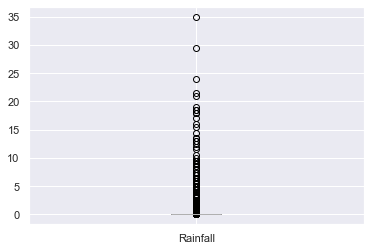

In [39]:
boxplot4=bikedata.boxplot(column=['Rainfall'])

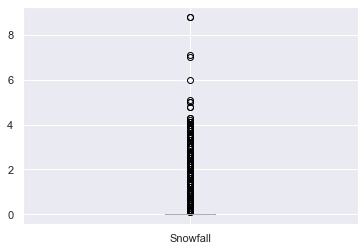

In [40]:
boxplot5=bikedata.boxplot(column=['Snowfall'])

In [41]:
oneHotCols=["Hour"]

In [42]:
bikedata=pd.get_dummies(bikedata, columns=oneHotCols)
bikedata.head(10)

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall,Snowfall,Holiday,...,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23
0,254,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,204,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
2,173,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
3,107,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
4,78,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
5,100,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
6,181,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
7,460,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
8,930,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
9,490,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
bikedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Rented Bike Count          8760 non-null   int64   
 1   Temperature(°C)            8760 non-null   float64 
 2   Humidity(%)                8760 non-null   int64   
 3   Wind speed (m/s)           8760 non-null   float64 
 4   Visibility (10m)           8760 non-null   int64   
 5   Dew point temperature(°C)  8760 non-null   float64 
 6   Solar Radiation (MJ/m2)    8760 non-null   float64 
 7   Rainfall                   8760 non-null   float64 
 8   Snowfall                   8760 non-null   float64 
 9   Holiday                    8760 non-null   int64   
 10  FunctioningDay             8760 non-null   int64   
 11  Year                       8760 non-null   int64   
 12  Month                      8760 non-null   int64   
 13  Day                        8760 n

In [44]:
bikedata=bikedata.drop('Dew point temperature(°C)',axis=1)
bikedata=bikedata.drop('WeekDay',axis=1)
bikedata=bikedata.drop('Hour_0',axis=1)
bikedata=bikedata.drop('Seasons_Autumn',axis=1)
#Dropping since dew point and temperature are highly correlated

In [45]:
bikedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   int64  
 1   Temperature(°C)          8760 non-null   float64
 2   Humidity(%)              8760 non-null   int64  
 3   Wind speed (m/s)         8760 non-null   float64
 4   Visibility (10m)         8760 non-null   int64  
 5   Solar Radiation (MJ/m2)  8760 non-null   float64
 6   Rainfall                 8760 non-null   float64
 7   Snowfall                 8760 non-null   float64
 8   Holiday                  8760 non-null   int64  
 9   FunctioningDay           8760 non-null   int64  
 10  Year                     8760 non-null   int64  
 11  Month                    8760 non-null   int64  
 12  Day                      8760 non-null   int64  
 13  WeekDayEncoding          8760 non-null   int64  
 14  Seasons_Spring          

In [46]:
bikedata.isnull().sum()

Rented Bike Count          0
Temperature(°C)            0
Humidity(%)                0
Wind speed (m/s)           0
Visibility (10m)           0
Solar Radiation (MJ/m2)    0
Rainfall                   0
Snowfall                   0
Holiday                    0
FunctioningDay             0
Year                       0
Month                      0
Day                        0
WeekDayEncoding            0
Seasons_Spring             0
Seasons_Summer             0
Seasons_Winter             0
Hour_1                     0
Hour_2                     0
Hour_3                     0
Hour_4                     0
Hour_5                     0
Hour_6                     0
Hour_7                     0
Hour_8                     0
Hour_9                     0
Hour_10                    0
Hour_11                    0
Hour_12                    0
Hour_13                    0
Hour_14                    0
Hour_15                    0
Hour_16                    0
Hour_17                    0
Hour_18       

In [47]:
bikedata["Rented Bike Count"].head()

0    254
1    204
2    173
3    107
4     78
Name: Rented Bike Count, dtype: int64

In [48]:
bikedata.describe()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall,Snowfall,Holiday,FunctioningDay,...,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,...,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,12.882922,58.226256,1.724909,1436.825799,0.569111,0.148687,0.075068,0.049315,0.966324,...,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667
std,644.997468,11.944825,20.362413,1.036300,608.298712,0.868746,1.128193,0.436746,0.216537,0.180404,...,0.199838,0.199838,0.199838,0.199838,0.199838,0.199838,0.199838,0.199838,0.199838,0.199838
min,0.000000,-17.800000,0.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,191.000000,3.500000,42.000000,0.900000,940.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,504.500000,13.700000,57.000000,1.500000,1698.000000,0.010000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1065.250000,22.500000,74.000000,2.300000,2000.000000,0.930000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3556.000000,39.400000,98.000000,7.400000,2000.000000,3.520000,35.000000,8.800000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


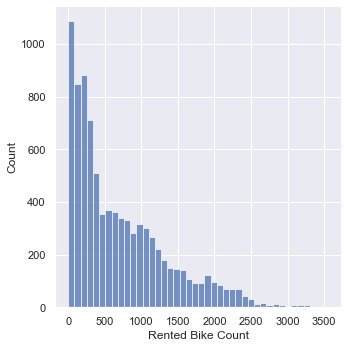

In [49]:
sns.set_theme()
sns.displot(bikedata['Rented Bike Count'])

In [50]:
bikecountmedian = bikedata['Rented Bike Count'].median()
bikecountmedian
#Since the data is right skewed we will consider median in this case if normally distributed we would have consderede mean

504.5

In [51]:
bikedata["Rented Bike Count"] = np.where(bikedata["Rented Bike Count"] <= bikecountmedian, 0, 1)
bikedata["Rented Bike Count"].unique()

array([0, 1])

In [52]:
bikedata.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall,Snowfall,Holiday,FunctioningDay,...,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23
0,0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,-5.5,38,0.8,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,-6.0,39,1.0,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,-6.2,40,0.9,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,-6.0,36,2.3,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0


## Split Data & Scaling

In [53]:
X = bikedata.drop("Rented Bike Count", axis=1)
y = bikedata['Rented Bike Count']

In [54]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=42)

In [55]:
X_train.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall,Snowfall,Holiday,FunctioningDay,Year,...,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23
1444,-11.1,50,1.2,1986,0.00,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
1652,-5.8,44,2.1,1994,0.00,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,1,0,0,0
7496,11.4,66,0.8,1991,0.18,0.0,0.0,1,0,2018,...,0,0,0,0,0,0,0,0,0,0
1893,-2.3,38,2.3,2000,0.00,0.0,0.0,1,1,2018,...,0,0,0,0,0,0,0,1,0,0
3880,19.1,54,3.2,542,0.94,0.0,0.0,0,1,2018,...,0,0,1,0,0,0,0,0,0,0


In [56]:
y_train.head()

1444    0
1652    0
7496    0
1893    0
3880    1
Name: Rented Bike Count, dtype: int64

In [57]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
Xtrain_transform=sc.fit_transform(X_train)

In [58]:
Xtest_transform=sc.fit_transform(X_test)

### Modelling

In [59]:
class_names = [0,1]

### SGD Classifier

In [60]:
alpha=[0.1,0.01,0.001,0.0001,0.00001]
tols=[1e-3,1e-6,1e-9,1e-12,1e-15,1e-18,1e-21,1e-24]
SGDtrainscore=[]
SGDtestscore=[]
SGDIterations=[]
SGDtrainscore1=[]
SGDtestscore1=[]
SGDIterations=[]
SGDIterations1=[]
SGDtimecmplx=[]
SGDtimecmplx1=[]
from sklearn.linear_model import SGDClassifier

In [61]:
for i in range(len(alpha)):
    sgdstarttime=time.time()
    sgdmodel = SGDClassifier(alpha=alpha[i],max_iter=1000000,tol=1e-3,learning_rate='optimal',random_state=42,shuffle=True)
    sgdmodel.fit(Xtrain_transform, y_train)
    sgdendtime=time.time()
    sgdmodeltime=sgdendtime-sgdstarttime
    sgdtrainscore=sgdmodel.score(Xtrain_transform, y_train)
    sgdtestscore=sgdmodel.score(Xtest_transform, y_test)
    sgditerations=sgdmodel.n_iter_
    SGDtrainscore.append(sgdtrainscore)
    SGDtestscore.append(sgdtestscore)
    SGDIterations.append(sgditerations)
    SGDtimecmplx.append(sgdmodeltime)
print(SGDtrainscore,SGDtestscore,SGDIterations,SGDtimecmplx)

[0.884703196347032, 0.9052511415525114, 0.9156881930854534, 0.9059034572733203, 0.9036203522504892] [0.8900304414003044, 0.9090563165905632, 0.91324200913242, 0.893455098934551, 0.9113394216133942] [9, 14, 42, 58, 119] [0.041036128997802734, 0.04170489311218262, 0.047386884689331055, 0.08459877967834473, 0.11835694313049316]


In [62]:
for i in range(len(tols)):
    sgdstarttime=time.time()
    sgdmodel = SGDClassifier(alpha=0.01,max_iter=1000000,tol=tols[i],learning_rate='optimal',random_state=42,shuffle=True)
    sgdmodel.fit(Xtrain_transform, y_train)
    sgdendtime=time.time()
    sgdmodeltime=sgdendtime-sgdstarttime
    sgdtrainscore1=sgdmodel.score(Xtrain_transform, y_train)
    sgdtestscore1=sgdmodel.score(Xtest_transform, y_test)
    sgditerations1=sgdmodel.n_iter_
    SGDtrainscore1.append(sgdtrainscore1)
    SGDtestscore1.append(sgdtestscore1)
    SGDIterations1.append(sgditerations1)
    SGDtimecmplx1.append(sgdmodeltime)
print(SGDtrainscore1,SGDtestscore1,SGDIterations1,SGDtimecmplx1)

[0.9052511415525114, 0.9059034572733203, 0.9059034572733203, 0.9059034572733203, 0.9059034572733203, 0.9059034572733203, 0.9059034572733203, 0.9059034572733203] [0.9090563165905632, 0.9101978691019786, 0.9101978691019786, 0.9101978691019786, 0.9101978691019786, 0.9101978691019786, 0.9101978691019786, 0.9101978691019786] [14, 47, 47, 47, 47, 47, 47, 47] [0.05721592903137207, 0.05793619155883789, 0.048232078552246094, 0.04441714286804199, 0.04926323890686035, 0.04598879814147949, 0.08560609817504883, 0.07701301574707031]


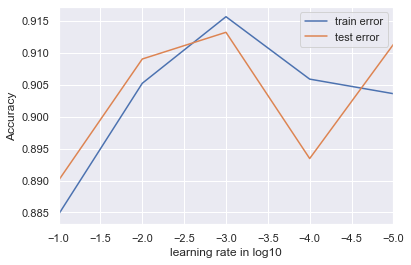

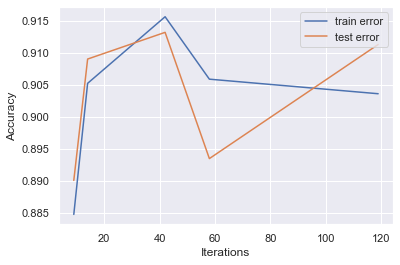

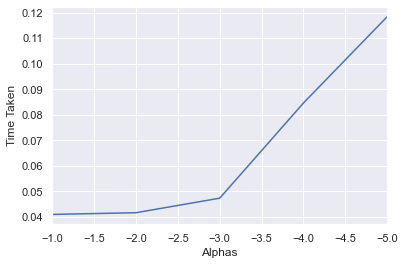

In [63]:
plt.plot(np.log10(alpha), SGDtrainscore,label="train error")
plt.plot(np.log10(alpha), SGDtestscore,label="test error")
plt.legend(loc="upper right")
plt.xlabel("learning rate in log10")
plt.ylabel("Accuracy")
plt.xlim(-1,-5)
plt.show()
plt.plot(SGDIterations, SGDtrainscore,label="train error")
plt.plot(SGDIterations, SGDtestscore,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Accuracy")
plt.show()
plt.plot(np.log10(alpha),SGDtimecmplx)
#plt.legend(loc="upper right")
plt.xlabel("Alphas")
plt.ylabel("Time Taken")
plt.xlim(-1,-5)
plt.show()

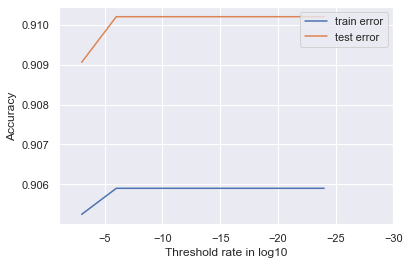

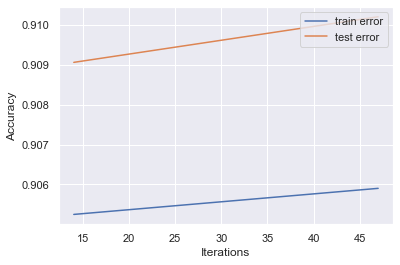

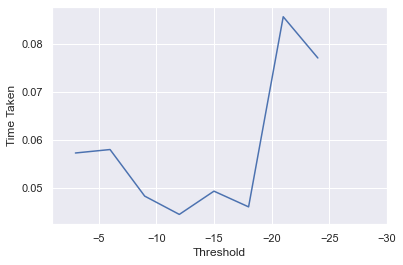

In [64]:
plt.plot(np.log10(tols), SGDtrainscore1,label="train error")
plt.plot(np.log10(tols), SGDtestscore1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Threshold rate in log10")
plt.ylabel("Accuracy")
plt.xlim(-1,-30)
plt.show()
plt.plot(SGDIterations1, SGDtrainscore1,label="train error")
plt.plot(SGDIterations1, SGDtestscore1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Accuracy")
plt.show()
plt.plot(np.log10(tols),SGDtimecmplx1)
#plt.legend(loc="upper right")
plt.xlabel("Threshold")
plt.ylabel("Time Taken")
plt.xlim(-1,-30)
plt.show()

In [65]:
###SGD Optimised model :
sgdmodelopt = SGDClassifier(alpha=0.001,max_iter=1000000,tol=1e-6,learning_rate='optimal',random_state=42,shuffle=True)
sgdmodelopt.fit(Xtrain_transform, y_train)
print(sgdmodelopt.score(Xtrain_transform, y_train))
print(sgdmodelopt.score(Xtest_transform, y_test))

0.9171559034572733
0.9143835616438356


Confusion matrix, without normalization
[[1204  120]
 [ 105 1199]]
Normalized confusion matrix
[[0.90936556 0.09063444]
 [0.08052147 0.91947853]]


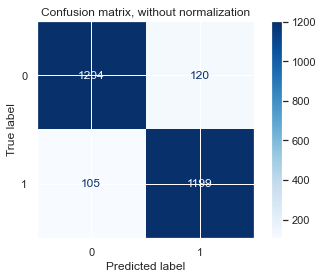

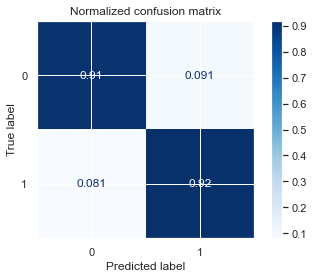

In [66]:
from sklearn.metrics import ConfusionMatrixDisplay
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        sgdmodelopt,
        Xtest_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [67]:
y_pred = sgdmodelopt.predict(Xtest_transform) # This will give you positive class prediction probabilities  
sgdmodelopt.score(Xtest_transform, y_pred)
auc_roc=metrics.roc_auc_score(y_test,y_pred)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.9144220432598743

Text(0.5, 0, 'False Positive Rate')

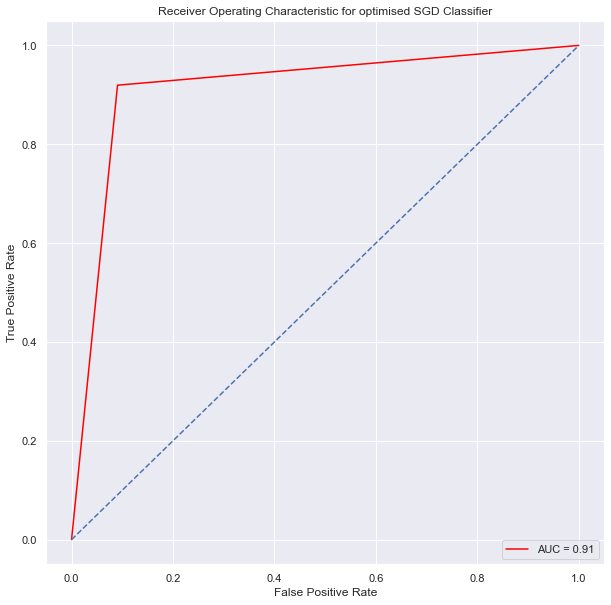

In [68]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised SGD Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

### SVM Classifier

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Holiday'>

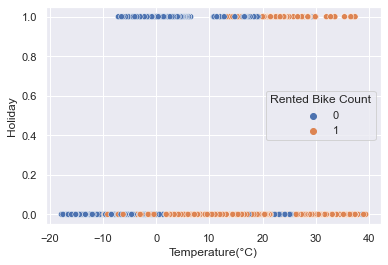

In [69]:
sns.scatterplot(data=bikedata, x="Temperature(°C)", y="Holiday",hue="Rented Bike Count")

In [70]:
C=[1.0,50.0,100.0,200.0,400.0]
kernel=['linear','rbf','sigmoid','poly']
from sklearn.svm import SVC
svctrainscore=[]
svctestscore=[]
svctrainscore1=[]
svctestscore1=[]
svctimecmplx1=[]
svctimecmplx2=[]

In [71]:
for i in range(len(C)):
    svcstarttime=time.time()
    svcmodel = SVC(gamma='auto',C=C[i],kernel='linear',tol=0.001,random_state=42)
    svcmodel.fit(Xtrain_transform, y_train)
    svcendtime=time.time()
    svcmodeltime=svcendtime-svcstarttime
    trainscore=svcmodel.score(Xtrain_transform, y_train)
    testscore=svcmodel.score(Xtest_transform, y_test)
    svctrainscore.append(trainscore)
    svctestscore.append(testscore)
    svctimecmplx1.append(svcmodeltime)
print(svctrainscore,svctestscore,svctimecmplx1)

[0.9194390084801044, 0.918460534898891, 0.9187866927592955, 0.918460534898891, 0.9186236138290933] [0.915144596651446, 0.9159056316590564, 0.9159056316590564, 0.9155251141552512, 0.915144596651446] [1.3271539211273193, 13.877630949020386, 24.038897275924683, 48.459881067276, 92.14434289932251]


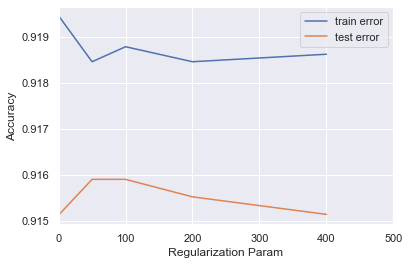

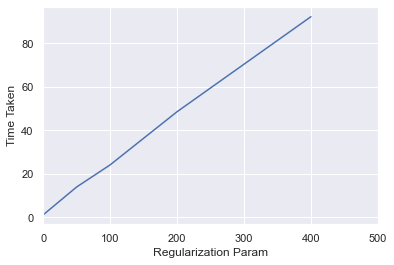

In [72]:
plt.plot(C,svctrainscore,label="train error")
plt.plot(C,svctestscore,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Regularization Param")
plt.ylabel("Accuracy")
plt.xlim(0,500)
plt.show()
plt.plot(C,svctimecmplx1)
#plt.legend(loc="upper right")
plt.xlabel("Regularization Param")
plt.ylabel("Time Taken")
plt.xlim(0,500)
plt.show()

In [73]:
for i in range(len(kernel)):
    svcstarttime=time.time()
    svcmodel = SVC(gamma='auto',C=50.0,kernel=kernel[i],tol=0.001,random_state=42)
    svcmodel.fit(Xtrain_transform, y_train)
    svcendtime=time.time()
    svcmodeltime=svcendtime-svcstarttime
    trainscore=svcmodel.score(Xtrain_transform, y_train)
    testscore=svcmodel.score(Xtest_transform, y_test)
    svctrainscore1.append(trainscore)
    svctestscore1.append(testscore)
    svctimecmplx2.append(svcmodeltime)
print(svctrainscore1,svctestscore1,svctimecmplx2)

[0.918460534898891, 0.9786366601435095, 0.8424657534246576, 0.9801043705153294] [0.9159056316590564, 0.9250380517503806, 0.856544901065449, 0.9208523592085236] [15.200816869735718, 0.9013371467590332, 0.5207569599151611, 1.027151107788086]


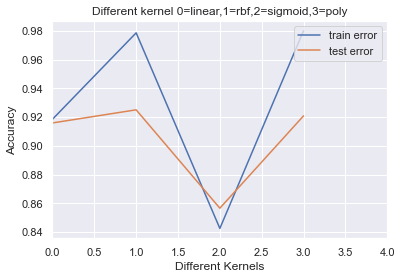

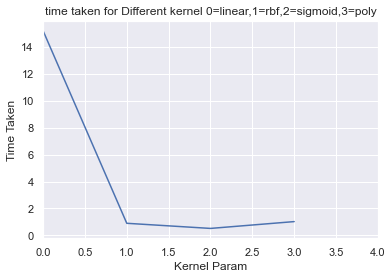

In [74]:
kernellist=[0,1,2,3]
plt.plot(kernellist,svctrainscore1,label="train error")
plt.plot(kernellist,svctestscore1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different Kernels")
plt.ylabel("Accuracy")
plt.title("Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()
plt.plot(kernellist,svctimecmplx2)
#plt.legend(loc="upper right")
plt.xlabel("Kernel Param")
plt.ylabel("Time Taken")
plt.title("time taken for Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()

In [75]:
###Optimised SVC Classifier :
svcmodelopt = SVC(gamma='auto',C=50.0,kernel='rbf',tol=0.001,random_state=42)
svcmodelopt.fit(Xtrain_transform, y_train)
svcmodelopttrainerror=svcmodelopt.score(Xtrain_transform, y_train)
svcmodelopttesterror=svcmodelopt.score(Xtest_transform, y_test)
print(svcmodelopttrainerror,svcmodelopttesterror)

0.9786366601435095 0.9250380517503806


Confusion matrix, without normalization
[[1216  108]
 [  89 1215]]
Normalized confusion matrix
[[0.918429   0.081571  ]
 [0.06825153 0.93174847]]


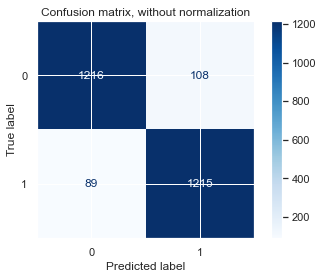

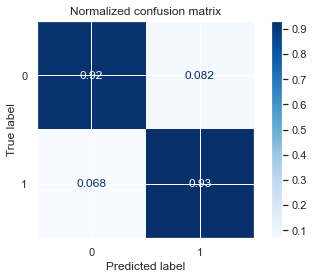

In [76]:
## Confusion Matrix with best intercept parameter ie.., at 100
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        svcmodelopt,
        Xtest_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [77]:
y_pred1 = svcmodelopt.predict(Xtest_transform) # This will give you positive class prediction probabilities  
svcmodelopt.score(Xtest_transform, y_pred1)
auc_roc=metrics.roc_auc_score(y_test,y_pred1)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.9250887346394083

Text(0.5, 0, 'False Positive Rate')

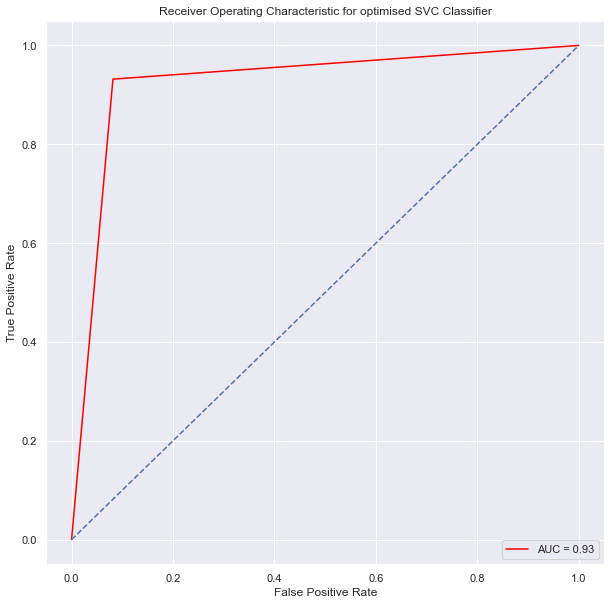

In [78]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised SVC Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

### Decision Tree

In [79]:
from sklearn.tree import DecisionTreeClassifier

dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [80]:
print(dTree.score(X_train, y_train))
print(dTree.score(X_test, y_test))

1.0
0.9094368340943684


In [81]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(X_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(dTree, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree.png')

In [82]:
dTree1 = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=15,min_samples_split=4)
dTree1.fit(X_train, y_train)
print(dTree1.score(X_train, y_train))
print(dTree1.score(X_test, y_test))

0.9856490541422048
0.9075342465753424


### Pre Pruning

In [83]:
maxdepth=[5,10,15,20,25]
minsamplessplit=[5,10,15,20,25]
minsamplesleaf=[1,2,4,8,10]
check=10
dTreetrainscore=[]
dTreetestscore=[]
dTreetrainscore1=[]
dTreetestscore1=[]
dTreetrainscore2=[]
dTreetestscore2=[]
dcttimecmplx1=[]
dcttimecmplx2=[]
dcttimecmplx3=[]

In [84]:
for i in range(len(maxdepth)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=maxdepth[i],min_samples_split=5,min_samples_leaf=1)
    dTree.fit(X_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(X_train, y_train)
    testscore=dTree.score(X_test, y_test)
    dTreetrainscore.append(trainscore)
    dTreetestscore.append(testscore)
    dcttimecmplx1.append(dTreetime)
print(dTreetrainscore,dTreetestscore,dcttimecmplx1)

[0.8695368558382257, 0.9590671885192433, 0.983529028049576, 0.9884213959556425, 0.9884213959556425] [0.8557838660578386, 0.9181887366818874, 0.9094368340943684, 0.9067732115677322, 0.9067732115677322] [0.03461408615112305, 0.03244423866271973, 0.036763906478881836, 0.050221920013427734, 0.05016613006591797]


In [85]:
for i in range(len(minsamplessplit)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=minsamplessplit[i],min_samples_leaf=1)
    dTree.fit(X_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(X_train, y_train)
    testscore=dTree.score(X_test, y_test)
    dTreetrainscore1.append(trainscore)
    dTreetestscore1.append(testscore)
    dcttimecmplx2.append(dTreetime)
print(dTreetrainscore1,dTreetestscore1,dcttimecmplx2)

[0.9590671885192433, 0.9522178734507502, 0.945368558382257, 0.941617742987606, 0.9391715590345727] [0.9181887366818874, 0.9193302891933028, 0.9185692541856926, 0.9185692541856926, 0.9155251141552512] [0.035314083099365234, 0.03106093406677246, 0.028928041458129883, 0.029678821563720703, 0.02828383445739746]


In [86]:
for i in range(len(minsamplesleaf)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=10,min_samples_leaf=minsamplesleaf[i])
    dTree.fit(X_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(X_train, y_train)
    testscore=dTree.score(X_test, y_test)
    dTreetrainscore2.append(trainscore)
    dTreetestscore2.append(testscore)
    dcttimecmplx3.append(dTreetime)
print(dTreetrainscore2,dTreetestscore2,dcttimecmplx3)

[0.9522178734507502, 0.9489562948467059, 0.9466731898238747, 0.9368884540117417, 0.9341161121983039] [0.9193302891933028, 0.9200913242009132, 0.9223744292237442, 0.9162861491628614, 0.917427701674277] [0.03336811065673828, 0.02970600128173828, 0.029428958892822266, 0.02809906005859375, 0.02774667739868164]


In [87]:
### Optimistic Decision Tree :
dTreeopt = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=10,min_samples_leaf=4)
dTreeopt.fit(X_train, y_train)
print(dTreeopt.score(X_train, y_train))
print(dTreeopt.score(X_test, y_test))

0.9466731898238747
0.9223744292237442


Confusion matrix, without normalization
[[1222  102]
 [ 102 1202]]
Normalized confusion matrix
[[0.92296073 0.07703927]
 [0.07822086 0.92177914]]


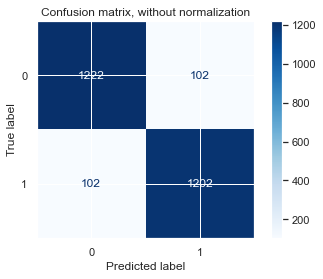

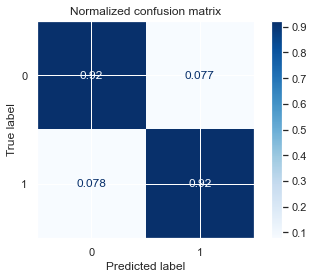

In [88]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dTreeopt,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [89]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(X_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(dTreeopt, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree.png')

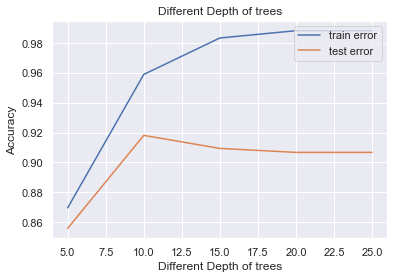

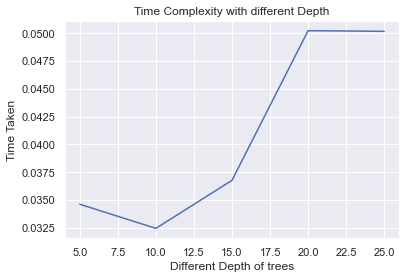

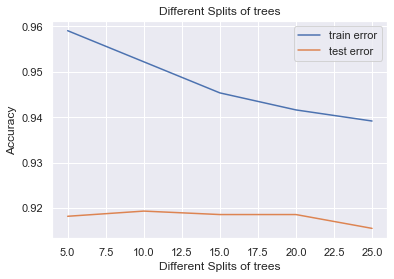

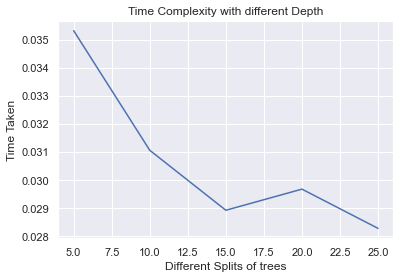

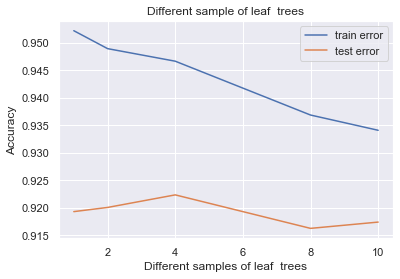

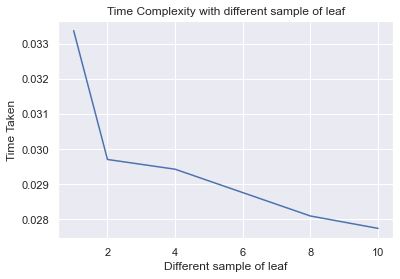

In [90]:
plt.plot(maxdepth,dTreetrainscore,label="train error")
plt.plot(maxdepth,dTreetestscore,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different Depth of trees")
plt.ylabel("Accuracy")
plt.title("Different Depth of trees")
#plt.xlim(0,4)
plt.show()
plt.plot(maxdepth,dcttimecmplx1)
#plt.legend(loc="upper right")
plt.xlabel("Different Depth of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
#plt.xlim(0,4)
plt.show()

plt.plot(minsamplessplit,dTreetrainscore1,label="train error")
plt.plot(minsamplessplit,dTreetestscore1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different Splits of trees")
plt.ylabel("Accuracy")
plt.title("Different Splits of trees")
#plt.xlim(0,4)
plt.show()
plt.plot(minsamplessplit,dcttimecmplx2)
#plt.legend(loc="upper right")
plt.xlabel("Different Splits of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
#plt.xlim(0,4)
plt.show()


plt.plot(minsamplesleaf,dTreetrainscore2,label="train error")
plt.plot(minsamplesleaf,dTreetestscore2,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different samples of leaf  trees")
plt.ylabel("Accuracy")
plt.title("Different sample of leaf  trees")
#plt.xlim(0,4)
plt.show()
plt.plot(minsamplesleaf,dcttimecmplx3)
#plt.legend(loc="upper right")
plt.xlabel("Different sample of leaf")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different sample of leaf")
#plt.xlim(0,4)
plt.show()

### Post Pruning

In [91]:
path = dTree.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
#print(ccp_alphas)

dTrees = []
for ccp_alpha in ccp_alphas:
    dTree = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    dTree.fit(X_train, y_train)
    dTrees.append(dTree)

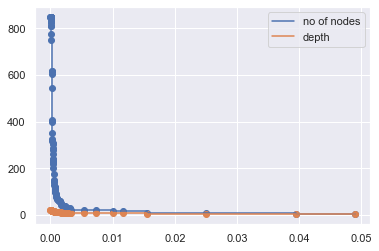

In [92]:
dTrees = dTrees[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [dTree.tree_.node_count for dTree in dTrees]
depth = [dTree.tree_.max_depth for dTree in dTrees]
plt.scatter(ccp_alphas,node_counts)
plt.scatter(ccp_alphas,depth)
plt.plot(ccp_alphas,node_counts,label='no of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas,depth,label='depth',drawstyle="steps-post")
plt.legend()
plt.show()

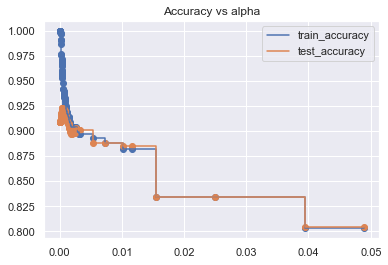

In [93]:
from sklearn.metrics import accuracy_score,confusion_matrix
dTreepostpruntrain_acc = []
dTreepostpruntest_acc = []
for c in dTrees:
    y_train_pred = c.predict(X_train)
    y_test_pred = c.predict(X_test)
    dTreepostpruntrain_acc.append(accuracy_score(y_train_pred,y_train))
    dTreepostpruntest_acc.append(accuracy_score(y_test_pred,y_test))

plt.scatter(ccp_alphas,dTreepostpruntrain_acc)
plt.scatter(ccp_alphas,dTreepostpruntest_acc)
plt.plot(ccp_alphas,dTreepostpruntrain_acc,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas,dTreepostpruntest_acc,label='test_accuracy',drawstyle="steps-post")
plt.legend()
plt.title('Accuracy vs alpha')
plt.show()

In [94]:
### Optimistic Decision Tree post pruning and prepruning :
dTreeopt1 = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=10,min_samples_leaf=4,ccp_alpha=0.01)
dTreeopt1.fit(X_train, y_train)
print(dTreeopt1.score(X_train, y_train))
print(dTreeopt1.score(X_test, y_test))

0.8884540117416829
0.8881278538812786


Confusion matrix, without normalization
[[1231   93]
 [ 201 1103]]
Normalized confusion matrix
[[0.92975831 0.07024169]
 [0.1541411  0.8458589 ]]


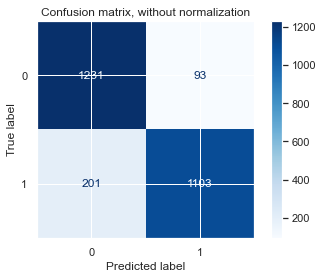

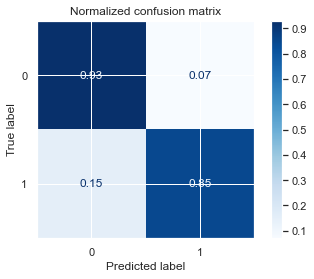

In [95]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dTreeopt1,
        X_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [96]:
y_pred2 = dTreeopt1.predict(X_test) # This will give you positive class prediction probabilities  
dTreeopt1.score(X_test, y_pred2)
auc_roc=metrics.roc_auc_score(y_test,y_pred2)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred2)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.8878086019313106

Text(0.5, 0, 'False Positive Rate')

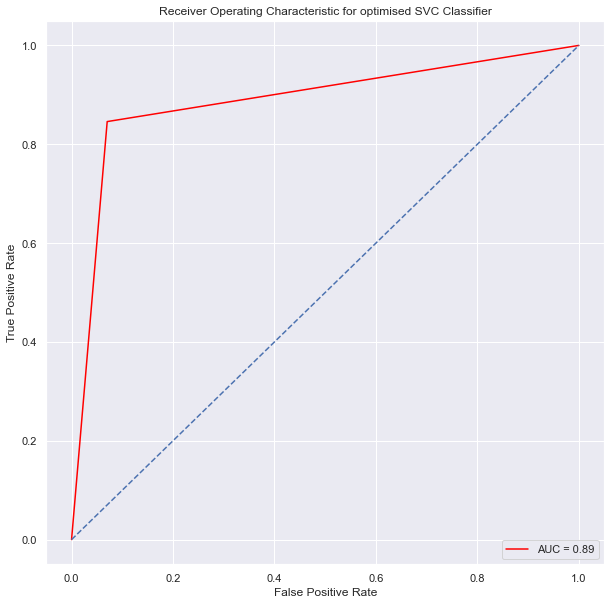

In [97]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised SVC Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

### Cross Validation

#### Implementing Cross Validation for optimised models

In [98]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
cvs=[2,5,10,15,20,25]
crossvalidationscores=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    model= SGDClassifier(alpha=0.001,max_iter=1000000,tol=1e-6,learning_rate='optimal',random_state=42,shuffle=True)
    results = cross_val_score(model, X, y, cv=kfold)
    crossvalidationscore=np.mean(results)*100.0
    crossvalidationscores.append(crossvalidationscore)
print(crossvalidationscores)

[77.70547945205479, 67.16894977168948, 71.14155251141553, 68.64155251141553, 72.02054794520546, 72.04177452177451]


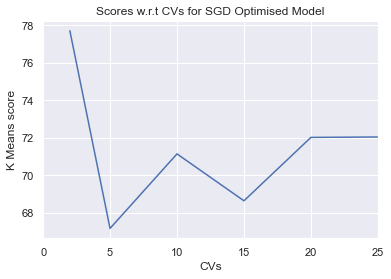

In [99]:
plt.plot(cvs,crossvalidationscores)
#plt.legend(loc="upper right")
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for SGD Optimised Model")
#plt.legend(loc="upper right")
plt.xlim(0,25)
plt.show()

In [100]:
crossvalidationscores1=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    model= SVC(gamma='auto',C=50.0,kernel='rbf',tol=0.001,random_state=42)
    results = cross_val_score(model, X, y, cv=kfold)
    crossvalidationscore1=np.mean(results)*100.0
    crossvalidationscores1.append(crossvalidationscore1)
    print(crossvalidationscore1)
print(crossvalidationscores1)

73.53881278538813
77.52283105022832
78.07077625570777
78.32191780821917
78.26484018264841
78.38941798941799
[73.53881278538813, 77.52283105022832, 78.07077625570777, 78.32191780821917, 78.26484018264841, 78.38941798941799]


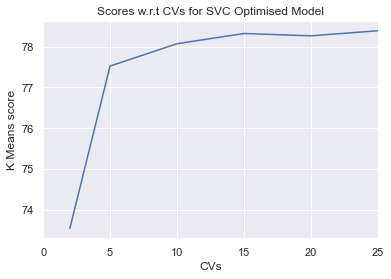

In [101]:
plt.plot(cvs,crossvalidationscores1)
#plt.legend(loc="upper right")
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for SVC Optimised Model")
#plt.legend(loc="upper right")
plt.xlim(0,25)
plt.show()

In [102]:
crossvalidationscores2=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    model= DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=10,min_samples_leaf=4,ccp_alpha=0.01)
    results = cross_val_score(model, X, y, cv=kfold)
    crossvalidationscore2=np.mean(results)*100.0
    crossvalidationscores2.append(crossvalidationscore2)
print(crossvalidationscores2)

[87.81963470319634, 87.86529680365298, 88.07077625570777, 88.03652968036529, 88.04794520547945, 87.99169719169718]


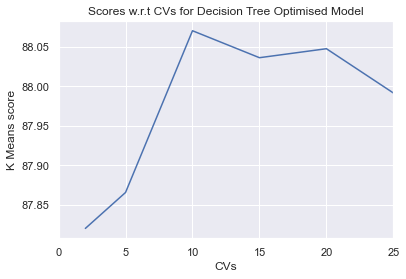

In [103]:
plt.plot(cvs,crossvalidationscores2)
#plt.legend(loc="upper right")
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for Decision Tree Optimised Model")
#plt.legend(loc="upper right")
plt.xlim(0,25)
plt.show()

### End of Code Refer Document for Explanation